# Anomaly Detection

In [1]:
#Uploading Training and Test data with predictions

import pandas as pd

train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')


trainpredict = pd.read_csv('train_predictions.csv')
testpredict = pd.read_csv('test_predictions.csv')


trainpredict['Timestamp'] = pd.to_datetime(trainpredict['Timestamp'])

11.916363406621185

# Visualizations

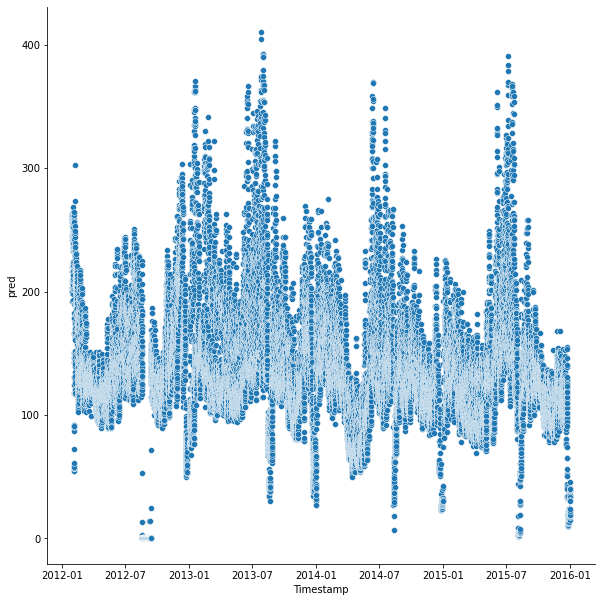

In [2]:
#Scatter Plot of Random Forest training predictions over time

import seaborn as sns


sns.relplot(data=trainpredict,x='Timestamp',y = 'pred',height=8.27)

C:\Users\rkapistalam\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


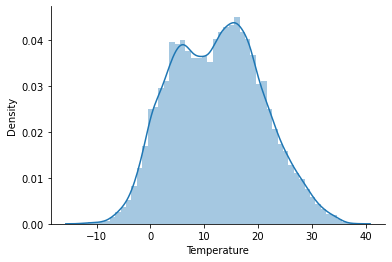

In [25]:
#Distribution of temperature in the dataset

import seaborn as sns

sns.distplot(trainpredict['Temperature'])
sns.despine()

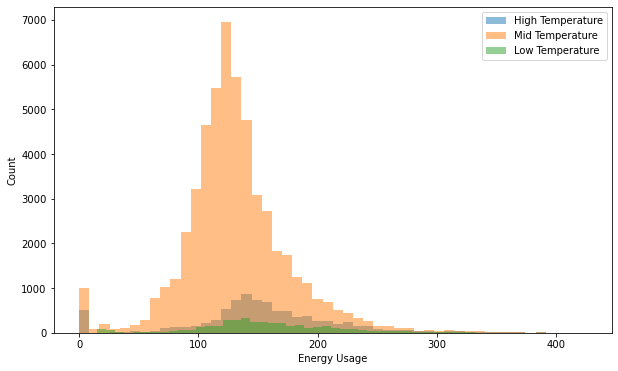

In [3]:
#Distribution of energy consumption based on temperature

import matplotlib.pyplot as plt

midtemp = trainpredict.loc[trainpredict['Temperature'] < 18.0,'tv delta']
midtemp2 = trainpredict.loc[trainpredict['Temperature'] > 2,'tv delta']

midtemp = midtemp.append(midtemp2)

a = trainpredict.loc[trainpredict['Temperature'] >= 18.0, 'tv delta']
b = midtemp
c = trainpredict.loc[trainpredict['Temperature'] <= 2, 'tv delta']
plt.figure(figsize=(10, 6))
plt.hist(a, bins = 50, alpha=0.5, label='High Temperature')
plt.hist(b, bins = 50, alpha=0.5, label='Mid Temperature')
plt.hist(c, bins = 50, alpha=0.5, label='Low Temperature')
plt.legend(loc='upper right')
plt.xlabel('Energy Usage')
plt.ylabel('Count')
plt.show();

# KNN Outlier Detector (PyOD)

Reference: https://towardsdatascience.com/anomaly-detection-with-pyod-b523fc47db9

In [4]:
#Create list with features

X_train = trainpredict[['Temperature', 'holiday', 'prev value','twice prev value','day shift','month shift','tv delta']]

X_test = testpredict[['Temperature', 'holiday', 'prev value','twice prev value','day shift','month shift','tv delta']]


In [5]:
import numpy as np
# train kNN detector
from pyod.models.knn import KNN

clf_name = 'KNN'
clf = KNN()
clf.fit(X_train)

# See anomaly scores for training data
y_train_scores = clf.decision_scores_

# You can then generate scores for the test set with decision_function
#An anomoaly score is a metric to evaluate how "anomalous" a point is based on set criteria
y_test_scores = clf.decision_function(X_test)

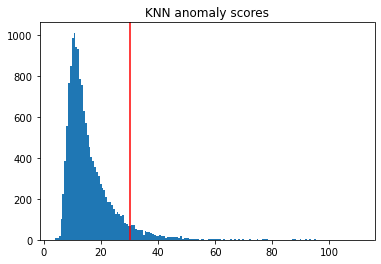

In [6]:
import matplotlib.pyplot as plt

#check the distribution of anomaly scores
plt.hist(y_test_scores, bins='auto') 

plt.axvline(30, 0,1000,color='red')

plt.title("KNN anomaly scores")
plt.show()


In [7]:
#Create dataframe with cluster labels

knncluster = testpredict
knncluster['score'] = y_test_scores
knncluster['cluster'] = np.where(knncluster['score']<30, 'Non-Outlier', 'Outlier')
knncluster['cluster'].value_counts() #about 6% outliers

# Summary statistics of clusters
knncluster.groupby('cluster')[["prev value", "twice prev value", "tv delta", "score"]].mean()



,prev value,twice prev value,tv delta,score
cluster,,,,
Non-Outlier,112.015205,112.205631,112.020740,14.241448
Outlier,170.796789,167.856201,170.879097,40.183653


In [ ]:
#More visualizations

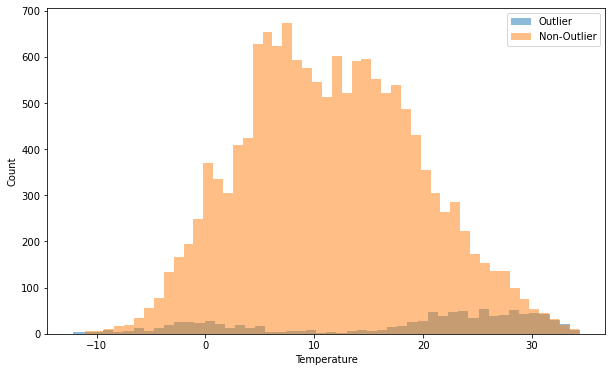

In [8]:
import matplotlib.pyplot as plt

#Temperature vs Outlier
a = knncluster.loc[knncluster['cluster'] == 'Outlier', 'Temperature']
b = knncluster.loc[knncluster['cluster'] == 'Non-Outlier', 'Temperature']
plt.figure(figsize=(10, 6))
plt.hist(a, bins = 50, alpha=0.5, label='Outlier')
plt.hist(b, bins = 50, alpha=0.5, label='Non-Outlier')
plt.legend(loc='upper right')
plt.xlabel('Temperature')
plt.ylabel('Count')
plt.show();

<AxesSubplot:xlabel='Timestamp', ylabel='tv delta'>

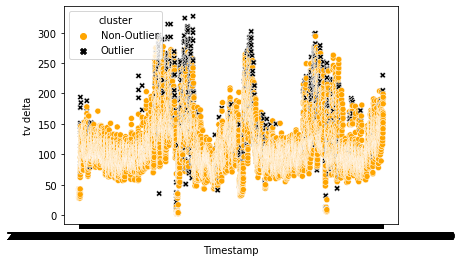

In [10]:
#Scatter plot of energy consumption over time, with outlier labels


sns.scatterplot(data=knncluster, x="Timestamp", y="tv delta", hue="cluster",style="cluster",palette=['orange','black'])


# Anomaly Detection based on our algorithm

https://towardsdatascience.com/anomaly-detection-with-time-series-forecasting-c34c6d04b24a

In [11]:
testpredict['Timestamp'] = pd.to_datetime(testpredict['Timestamp'])

predicted_df = testpredict[['Timestamp', 'value delta', 'pred']].copy()

In [12]:
#Create dataframe with actual energy consumption and predicted values based on Random Forest

predicted_df.columns = ['load_date', 'actuals','predicted']

predicted_df['load_date2'] = predicted_df['load_date']

predicted_df = predicted_df.set_index('load_date2')

predicted_df


,load_date,actuals,predicted
load_date2,,,
2016-01-01 00:00:00+00:00,2016-01-01 00:00:00+00:00,41.0,42.866667
2016-01-01 01:00:00+00:00,2016-01-01 01:00:00+00:00,43.0,39.996667
2016-01-01 02:00:00+00:00,2016-01-01 02:00:00+00:00,30.0,36.516667
2016-01-01 03:00:00+00:00,2016-01-01 03:00:00+00:00,42.0,40.340000
2016-01-01 04:00:00+00:00,2016-01-01 04:00:00+00:00,43.0,41.810000
...,...,...,...
2017-12-05 04:00:00+00:00,2017-12-05 04:00:00+00:00,199.0,163.490000
2017-12-05 05:00:00+00:00,2017-12-05 05:00:00+00:00,165.0,180.130000
2017-12-05 06:00:00+00:00,2017-12-05 06:00:00+00:00,192.0,188.845000


In [13]:
#Compute error term, rolling mean and standard deviation, and classify anomalies based on SD
#Only works on normal data, which our data is


import numpy as np
def detect_classify_anomalies(df,window):
    df.replace([np.inf, -np.inf], np.NaN, inplace=True)
    df.fillna(0,inplace=True)
    df['error']=df['actuals']-df['predicted']
    df['percentage_change'] = ((df['actuals'] - df['predicted']) / df['actuals']) * 100
    df['meanval'] = df['error'].rolling(window=window).mean()
    df['deviation'] = df['error'].rolling(window=window).std()
    df['-3s'] = df['meanval'] - (2 * df['deviation'])
    df['3s'] = df['meanval'] + (2 * df['deviation'])
    df['-2s'] = df['meanval'] - (1.75 * df['deviation'])
    df['2s'] = df['meanval'] + (1.75 * df['deviation'])
    df['-1s'] = df['meanval'] - (1.5 * df['deviation'])
    df['1s'] = df['meanval'] + (1.5 * df['deviation'])
    cut_list = df[['error', '-3s', '-2s', '-1s', 'meanval', '1s', '2s', '3s']]
    cut_values = cut_list.values
    cut_sort = np.sort(cut_values)
    df['impact'] = [(lambda x: np.where(cut_sort == df['error'][x])[1][0])(x) for x in
                               range(len(df['error']))]
    severity = {0: 3, 1: 2, 2: 1, 3: 0, 4: 0, 5: 1, 6: 2, 7: 3}
    region = {0: "NEGATIVE", 1: "NEGATIVE", 2: "NEGATIVE", 3: "NEGATIVE", 4: "POSITIVE", 5: "POSITIVE", 6: "POSITIVE",
              7: "POSITIVE"}
    df['color'] =  df['impact'].map(severity)
    df['region'] = df['impact'].map(region)
    df['anomaly_points'] = np.where(df['color'] == 3, df['error'], np.nan)
    df = df.sort_values(by='load_date', ascending=False)
    df.load_date = pd.to_datetime(df['load_date'].astype(str), format="%Y-%m-%d")
    return df

In [14]:
import plotly.graph_objs as go
from plotly.offline import iplot

In [19]:
#Function to plot data resulting from previous calculation

def plot_anomaly(df,metric_name):
    #error = pd.DataFrame(Order_results.error.values)
    #df = df.sort_values(by='load_date', ascending=False)
    #df.load_date = pd.to_datetime(df['load_date'].astype(str), format="%Y%m%d")
    dates = df.load_date
    #meanval = error.rolling(window=window).mean()
    #deviation = error.rolling(window=window).std()
    #res = error
    #upper_bond=meanval + (2 * deviation)
    #lower_bond=meanval - (2 * deviation)
    #anomalies = pd.DataFrame(index=res.index, columns=res.columns)
    #anomalies[res < lower_bond] = res[res < lower_bond]
    #anomalies[res > upper_bond] = res[res > upper_bond]
    bool_array = (abs(df['anomaly_points']) > 0)
#And a subplot of the Actual Values.
    actuals = df["actuals"][-len(bool_array):]
    anomaly_points = bool_array * actuals
    anomaly_points[anomaly_points == 0] = np.nan
    #Order_results['meanval']=meanval
    #Order_results['deviation']=deviation
    color_map= {0: 'rgb(228, 222, 249)', 1: "yellow", 2: "orange", 3: "red"}
    table = go.Table(
    domain=dict(x=[0, 1],
                y=[0, 0.3]),
    columnwidth=[1, 2 ],
    #columnorder=[0, 1, 2,],
    header = dict(height = 20,
                  values = [['<b>Date</b>'],['<b>Actual Values </b>'],
                            ['<b>Predicted</b>'], ['<b>% Difference</b>'],['<b>Severity (0-3)</b>']],
                 font = dict(color=['rgb(45, 45, 45)'] * 5, size=14),
                  fill = dict(color='#d562be')),
    cells = dict(values = [df.round(3)[k].tolist() for k in ['load_date', 'actuals', 'predicted',
                                                               'percentage_change','color']],
                 line = dict(color='#506784'),
                 align = ['center'] * 5,
                 font = dict(color=['rgb(40, 40, 40)'] * 5, size=12),
                 #format = [None] + [",.4f"] + [',.4f'],
                 #suffix=[None] * 4,
                 suffix=[None] + [''] + [''] + ['%'] + [''],
                 height = 27,
                 #fill = dict(color=['rgb(235, 193, 238)', 'rgba(228, 222, 249, 0.65)']))
                 fill=dict(color=  # ['rgb(245,245,245)',#unique color for the first column
                      [df['color'].map(color_map)],
                      )
    ))
    #df['ano'] = np.where(df['color']==3, df['error'], np.nan)
    anomalies = go.Scatter(name="Anomaly",
                       x=dates,
                       xaxis='x1',
                       yaxis='y1',
                       y=df['anomaly_points'],
                       mode='markers',
                       marker = dict(color ='red',
                      size = 11,line = dict(
                                         color = "red",
                                         width = 2)))
    upper_bound = go.Scatter(hoverinfo="skip",
                         x=dates,
                         showlegend =False,
                         xaxis='x1',
                         yaxis='y1',
                         y=df['3s'],
                         marker=dict(color="#444"),
                         line=dict(
                             color=('rgb(23, 96, 167)'),
                             width=2,
                             dash='dash'),
                         fillcolor='rgb(68, 68, 68)',
                         fill='tonexty')
    lower_bound = go.Scatter(name='Confidence',
                          x=dates,
                         xaxis='x1',
                         yaxis='y1',
                          y=df['-3s'],
                          marker=dict(color="#444"),
                          line=dict(
                              color=('rgb(23, 96, 167)'),
                              width=2,
                              dash='dash'),
                          fillcolor='rgb(68, 68, 68)',
                          fill='tonexty')
    Actuals = go.Scatter(name= 'Actuals',
                     x= dates,
                     y= df['actuals'],
                    xaxis='x2', yaxis='y2',
                     mode='lines',
                     marker=dict(size=12,
                                 line=dict(width=1),
                                 color="blue"))
    Predicted = go.Scatter(name= 'Predicted',
                     x= dates,
                     y= df['predicted'],
                    xaxis='x2', yaxis='y2',
                     mode='lines',
                     marker=dict(size=12,
                                 line=dict(width=1),
                                 color="orange"))
# create plot for error...
    Error = go.Scatter(name="Error",
                   x=dates, y=df['error'],
                   xaxis='x1',
                   yaxis='y1',
                   mode='lines',
                   marker=dict(size=12,
                               line=dict(width=1),
                               color="red"),
                   text="Error")
    anomalies_map = go.Scatter(name = "anomaly actual",
                                   showlegend=False,
                                   x=dates,
                                   y=anomaly_points,
                                   mode='markers',
                                   xaxis='x2',
                                   yaxis='y2',
                                    marker = dict(color ="red",
                                  size = 11,
                                 line = dict(
                                     color = "red",
                                     width = 2)))
    Mvingavrg = go.Scatter(name="Moving A",
                           x=dates,
                           y=df['meanval'],
                           mode='lines',
                           xaxis='x1',
                           yaxis='y1',
                           marker=dict(size=12,
                                       line=dict(width=1),
                                       color="green"),
                           text="Moving A")
    axis=dict(
        showline=True,
        zeroline=False,
        showgrid=True,
        mirror=True,
        ticklen=4,
        gridcolor='#ffffff',
        tickfont=dict(size=10))
    layout = dict(
        width=1000,
        height=865,
        autosize=False,
        title= metric_name,
        margin = dict(t=75),
        showlegend=True,
        xaxis1=dict(axis, **dict(domain=[0, 1], anchor='y1', showticklabels=True)),
        xaxis2=dict(axis, **dict(domain=[0, 1], anchor='y2', showticklabels=True)),
        yaxis1=dict(axis, **dict(domain=[2 * 0.21 + 0.20 + 0.09, 1], anchor='x1', hoverformat='.2f')),
        yaxis2=dict(axis, **dict(domain=[0.21 + 0.12, 2 * 0.31 + 0.02], anchor='x2', hoverformat='.2f')))
    fig = go.Figure(data = [table,anomalies,anomalies_map,
                        upper_bound,lower_bound,Actuals,Predicted,
                        Mvingavrg,Error], layout = layout)
    iplot(fig)
    pyplot.show()


In [20]:
#Compute rolling average, standard deviation and plot with our predicted/actuals values

classify_df=detect_classify_anomalies(predicted_df,'14D')
#classify_df.reset_index(inplace=True)
#del classify_df['index']
plot_anomaly(classify_df,"metric_name")

NameError: name 'pyplot' is not defined

In [10]:
testpredict = testpredict.rename(columns={"Timestamp": 'load_date', 'tv delta': 'actuals', 'pred': 'predicted'})

In [11]:
testpredict2=testpredict

testpredict2['load_date2'] = testpredict2['load_date']

testpredict2 = testpredict.set_index('load_date2')

In [15]:
classify_df = detect_classify_anomalies(testpredict2,'14D')

In [16]:
#Get information about clusters with Random Forest model

classify_df

classify_df['cluster'] = np.where(classify_df['color']==3, 'Outlier', 'Non-Outlier')
classify_df['cluster'].value_counts() #about 5% outliers

#pd.set_option('display.max_columns', None)

#classify_df.groupby('cluster')[["prev value", "twice prev value", "actuals"]].mean()


Non-Outlier    15004
Outlier          824
Name: cluster, dtype: int64

In [17]:
#Scatter Plot for Random Forest anomaly detection with outlier labels

classify_df
#classify_df['Timestamp'] = pd.to_datetime(classify_df['Timestamp'])
#sns.scatterplot(data=classify_df, x=classify_df.index.values, y="actuals", hue="cluster",style="cluster",palette=['orange','black'])

,Unnamed: 0,Unnamed: 0.1,load_date,Values,Temperature,holiday,Weekday,Hour,Month,Day,...,3s,-2s,2s,-1s,1s,impact,color,region,anomaly_points,cluster
load_date2,,,,,,,,,,,,,,,,,,,,,
2017-12-05 08:00:00+00:00,15827,49723,2017-12-05 08:00:00+00:00,17828107.0,-5.7,0,1,8,12,5,...,34.217006,-35.672356,29.557715,-31.013065,24.898424,3,0,NEGATIVE,NaN,Non-Outlier
2017-12-05 07:00:00+00:00,15826,49722,2017-12-05 07:00:00+00:00,17827913.0,-4.7,0,1,7,12,5,...,34.221938,-35.631191,29.565063,-30.974316,24.908187,3,0,NEGATIVE,NaN,Non-Outlier
2017-12-05 06:00:00+00:00,15825,49721,2017-12-05 06:00:00+00:00,17827730.0,-6.7,0,1,6,12,5,...,34.411486,-35.644647,29.741077,-30.974238,25.070669,4,0,POSITIVE,NaN,Non-Outlier
2017-12-05 05:00:00+00:00,15824,49720,2017-12-05 05:00:00+00:00,17827538.0,-5.5,0,1,5,12,5,...,34.403577,-35.647203,29.733525,-30.977151,25.063473,3,0,NEGATIVE,NaN,Non-Outlier
2017-12-05 04:00:00+00:00,15823,49719,2017-12-05 04:00:00+00:00,17827373.0,-5.5,0,1,4,12,5,...,34.403889,-35.613623,29.736055,-30.945788,25.068221,7,3,POSITIVE,35.510000,Outlier
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-01-01 04:00:00+00:00,4,33900,2016-01-01 04:00:00+00:00,15838399.0,5.2,1,4,4,1,1,...,7.100768,-7.161922,6.149922,-6.211076,5.199076,4,0,POSITIVE,NaN,Non-Outlier
2016-01-01 03:00:00+00:00,3,33899,2016-01-01 03:00:00+00:00,15838356.0,5.2,1,4,3,1,1,...,7.576264,-8.372981,6.512981,-7.309698,5.449698,4,0,POSITIVE,NaN,Non-Outlier
2016-01-01 02:00:00+00:00,2,33898,2016-01-01 02:00:00+00:00,15838314.0,5.0,1,4,2,1,1,...,7.727514,-10.124075,6.537408,-8.933969,5.347302,3,0,NEGATIVE,NaN,Non-Outlier


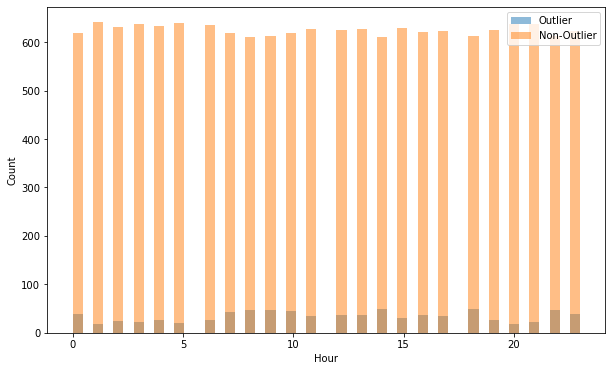

In [128]:
#Temperature vs Outlier
a = classify_df.loc[classify_df['cluster'] == 'Outlier', 'Hour']
b = classify_df.loc[classify_df['cluster'] == 'Non-Outlier', 'Hour']
plt.figure(figsize=(10, 6))
plt.hist(a, bins = 50, alpha=0.5, label='Outlier')
plt.hist(b, bins = 50, alpha=0.5, label='Non-Outlier')
plt.legend(loc='upper right')
plt.xlabel('Hour')
plt.ylabel('Count')
plt.show();

<AxesSubplot:xlabel='Hour', ylabel='Percent Outlier'>

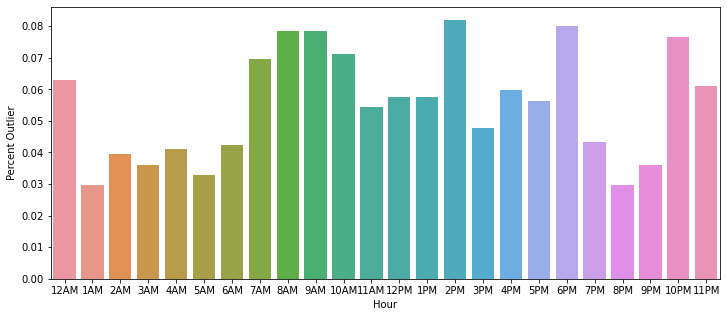

In [184]:
#Percentage of outliers based on hour of day


#monthc = classify_df.groupby(['Month',"cluster"]).count()

#monthc = monthc.reset_index()

hourcluster = classify_df.groupby(["Hour","cluster"]).count()

hourcluster = hourcluster.reset_index()

outlierhour = hourcluster[hourcluster['cluster']=='Outlier']
outlierhour = outlierhour.reset_index()
outlierhour = outlierhour[["Hour","Values"]]

nonoutlierhour = hourcluster[hourcluster['cluster']=='Non-Outlier']
nonoutlierhour = nonoutlierhour.reset_index()

outlierhour['Non-Outlier'] = nonoutlierhour["Values"]

outlierhour['Percent Outlier'] = outlierhour['Values']/outlierhour['Non-Outlier']

l = ["12AM","1AM","2AM","3AM","4AM","5AM","6AM","7AM","8AM","9AM","10AM","11AM","12PM","1PM","2PM","3PM",
     "4PM","5PM","6PM","7PM","8PM","9PM","10PM","11PM"]

outlierhour['Hour'] = l
fig_dims = (12, 5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x="Hour", y="Percent Outlier", ax=ax,data=outlierhour)



<AxesSubplot:xlabel='Weekday', ylabel='Percent Outlier'>

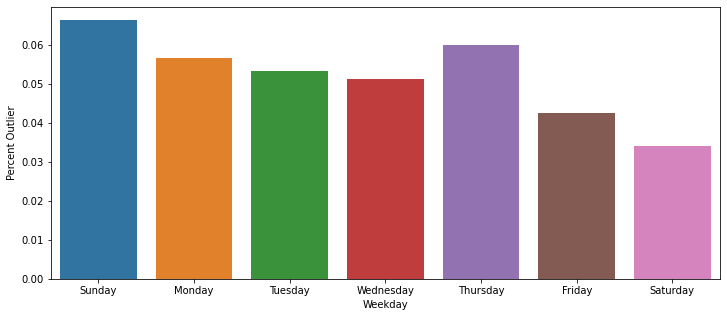

In [193]:
#Percent of outliers based on day of week

daycluster = classify_df.groupby(["Weekday","cluster"]).count()

daycluster = daycluster.reset_index()

outlierday = daycluster[daycluster['cluster']=='Outlier']
outlierday = outlierday.reset_index()
outlierday = outlierday[["Weekday","Values"]]

nonoutlierday = daycluster[daycluster['cluster']=='Non-Outlier']
nonoutlierday = nonoutlierday.reset_index()

outlierday['Non-Outlier'] = nonoutlierday["Values"]

outlierday['Percent Outlier'] = outlierday['Values']/(outlierday['Non-Outlier']+outlierday['Values'])

l = ["Sunday","Monday","Tuesday","Wednesday","Thursday","Friday","Saturday"]

outlierday['Weekday'] = l
fig_dims = (12, 5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x="Weekday", y="Percent Outlier", ax=ax,data=outlierday)


<AxesSubplot:xlabel='holiday', ylabel='Percent Outlier'>

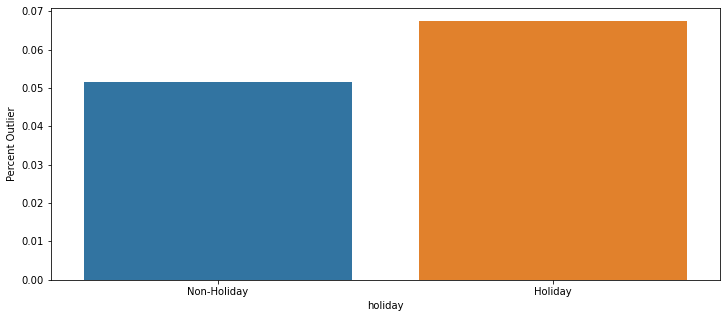

In [194]:
#Percent of outliers based on Holiday

holcluster = classify_df.groupby(["holiday","cluster"]).count()

holcluster = holcluster.reset_index()

outlierhol = holcluster[holcluster['cluster']=='Outlier']
outlierhol = outlierhol.reset_index()
outlierhol = outlierhol[["holiday","Values"]]

nonoutlierhol = holcluster[holcluster['cluster']=='Non-Outlier']
nonoutlierhol = nonoutlierhol.reset_index()

outlierhol['Non-Outlier'] = nonoutlierhol["Values"]

outlierhol['Percent Outlier'] = outlierhol['Values']/(outlierhol['Non-Outlier']+outlierhol['Values'])

l = ["Non-Holiday","Holiday"]

outlierhol['holiday'] = l
fig_dims = (12, 5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x="holiday", y="Percent Outlier", ax=ax,data=outlierhol)


# Isolated Forest (PyOD)

In [21]:
from pyod.models.iforest import IForest

clf1 = IForest(behaviour="new", max_samples=500) 
clf1.fit(X_train)

IForest(behaviour='new', bootstrap=False, contamination=0.1, max_features=1.0,
    max_samples=500, n_estimators=100, n_jobs=1, random_state=None,
    verbose=0)

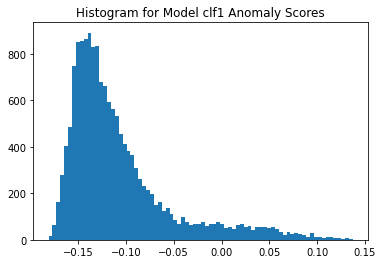

In [22]:
# clf.decision_function: Predict raw anomaly score of X using the fitted detector.
# We apply the model to the test data X_test to get the outlier scores.
y_test_scores = clf1.decision_function(X_test)  # outlier scores
y_test_scores = pd.Series(y_test_scores)
y_test_scores.head()

import matplotlib.pyplot as plt
plt.hist(y_test_scores, bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram for Model clf1 Anomaly Scores")
plt.show()

In [26]:
#Data table about clusters

iforestcluster = testpredict
iforestcluster['score'] = y_test_scores
iforestcluster['cluster'] = np.where(iforestcluster['score']<0, 'Non-Outlier', 'Outlier')
iforestcluster['cluster'].value_counts() #about 6% outliers

# Summary statistics of clusters
iforestcluster.groupby('cluster')[["prev value", "twice prev value", "tv delta", "score"]].mean()

,prev value,twice prev value,tv delta,score
cluster,,,,
Non-Outlier,113.965652,114.024460,114.068953,-0.118713
Outlier,139.373142,138.471504,138.160376,0.045825


<AxesSubplot:xlabel='Timestamp', ylabel='tv delta'>

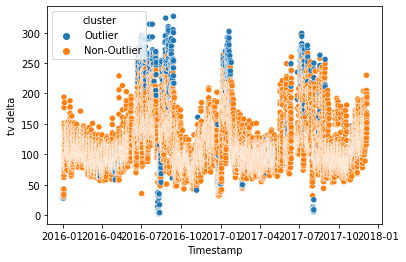

In [28]:
#Scatter plot for anomaly detection with Isolated Forest

sns.scatterplot(data=iforestcluster, x="Timestamp", y="tv delta", hue="cluster")